#Assignment 6 - Attention and Transformers

### Package installs (DO NOT CHANGE)

In [ ]:
!pip install -q torch torchvision  tensorboardX scipy matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.4/125.4 KB 12.3 MB/s eta 0:00:00


### Library imports (DO NOT CHANGE)

In [ ]:
import os
import time
import math

import torch
from torch import nn
import torchvision
from tqdm import tqdm
from tensorboardX import SummaryWriter
from copy import deepcopy
import matplotlib.pyplot as plt
import numpy as np
from scipy import interpolate
from matplotlib.patches import Rectangle
import itertools
from collections import OrderedDict
from torch.optim.lr_scheduler import LambdaLR
from typing import Tuple

%matplotlib inline
%load_ext tensorboard

### Model config and utils (DO NOT CHANGE)

In [ ]:
config = OrderedDict(
    load_checkpoint_file=None,

    optimizer="SGD",
    optimizer_warmup_ratio=0.05,
    optimizer_learning_rate=0.1,
    optimizer_momentum=0.9,
    optimizer_weight_decay=0.0001,
    batch_size=100,
    num_epochs=300,
    seed=317,

    hidden_size=400,
    num_hidden_layers=6,
    num_attention_heads=9,
    intermediate_size=512,
    hidden_act="gelu",
    hidden_dropout_prob=0.1,
    attention_probs_dropout_prob=0.1,
    layer_norm_eps=1e-12,

    gaussian_init_sigma_std=0.01,
    gaussian_init_mu_std=2.,
    pooling_concatenate_size=2,

    num_keep_checkpoints=30,
    output_dir="./logs/",
)

def plot_grid_query_pix(width, ax=None):
    if ax is None:
        plt.figure()
        ax = plt.gca()

    ax.set_xticks(np.arange(-width / 2, width / 2))
    ax.set_aspect(1)
    ax.set_yticks(np.arange(-width / 2, width / 2))
    ax.tick_params(
        axis="both",
        which="both",
        bottom=False,
        top=False,
        left=False,
        labelbottom=False,
        labelleft=False,
    )
    ax.grid(True, alpha=0.5)

    query_pix = Rectangle(xy=(-0.5,-0.5),
                          width=1,
                          height=1,
                          edgecolor="black",
                          fc='None',
                          lw=2)

    ax.add_patch(query_pix)

    ax.set_xlim(-width / 2, width / 2)
    ax.set_ylim(-width / 2, width / 2)
    ax.set_aspect("equal")


def plot_attention_layer(model, layer_idx, width, ax=None):
    if ax is None:
        fig, ax = plt.subplots()

    attention = model.encoder.layer[layer_idx].attention.self_attention
    attention_probs = attention.get_attention_probs(width + 2, width + 2)

    contours = np.array([0.9, 0.5])
    linestyles = [":", "-"]
    flat_colors = ["#3498db", "#f1c40f", "#2ecc71", "#e74c3c", "#e67e22", "#9b59b6", "#34495e", "#1abc9c", "#95a5a6"]

    shape = attention_probs.shape

    if len(shape) == 6:
        shape = shape[1:]
    height, width, num_heads, _, _ = shape

    attention_at_center = attention_probs[width // 2, height // 2]
    attention_at_center = attention_at_center.detach().cpu().numpy()

    n = 1000
    t = np.linspace(0, attention_at_center.max(), n)
    integral = ((attention_at_center >= t[:, None, None, None]) * attention_at_center).sum(
        axis=(-1, -2)
    )

    plot_grid_query_pix(width - 2, ax)

    for h, color in zip(range(num_heads), itertools.cycle(flat_colors)):
        f = interpolate.interp1d(integral[:, h], t, fill_value=(1, 0), bounds_error=False)
        t_contours = f(contours)

        keep_contour = np.concatenate([np.array([True]), np.diff(t_contours) > 0])
        t_contours = t_contours[keep_contour]

        for t_contour, linestyle in zip(t_contours, linestyles):
            ax.contour(
                np.arange(-width // 2, width // 2) + 1,
                np.arange(-height // 2, height // 2) + 1,
                attention_at_center[h],
                [t_contour],
                extent=[- width // 2, width // 2 + 1, - height // 2, height // 2 + 1],
                colors=color,
                linestyles=linestyle
            )

    return ax


def plot_attention_positions_all_layers(model, width, tensorboard_writer=None, global_step=None):
    for layer_idx in range(len(model.encoder.layer)):
        fig, ax = plt.subplots()
        plot_attention_layer(model, layer_idx, width, ax=ax)

        ax.set_title(f"Layer {layer_idx + 1}")
        if tensorboard_writer:
            tensorboard_writer.add_figure(f"attention/layer{layer_idx}", fig, global_step=global_step)
        plt.close(fig)


class Mean:
    def __init__(self, update_weight=1):
        self.average = None
        self.counter = 0
        self.update_weight = update_weight

    def add(self, value, weight=1):
        self.counter += weight
        if self.average is None:
            self.average = deepcopy(value)
        else:
            delta = value - self.average
            self.average += delta * self.update_weight * weight / (self.counter + self.update_weight - 1)
            if isinstance(self.average, torch.Tensor):
                self.average.detach()

    def value(self):
        return self.average

def accuracy(predicted_logits, reference):
    labels = torch.argmax(predicted_logits, 1)
    correct_predictions = labels.eq(reference)
    return correct_predictions.sum().float() / correct_predictions.nelement()


def log_metric(name, values, tags):
    print("{name}: {values} ({tags})".format(name=name, values=values, tags=tags))


def get_dataloaders(test_batch_size=100, shuffle_train=True, num_workers=2, data_root="./data"):
    dataset = torchvision.datasets.CIFAR10

    data_mean = (0.4914, 0.4822, 0.4465)
    data_stddev = (0.2023, 0.1994, 0.2010)

    transform_train = torchvision.transforms.Compose(
        [
            torchvision.transforms.RandomCrop(32, padding=4),
            torchvision.transforms.RandomHorizontalFlip(),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(data_mean, data_stddev),
        ]
    )

    transform_test = torchvision.transforms.Compose(
        [
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(data_mean, data_stddev),
        ]
    )

    training_set = dataset(root=data_root, train=True, download=True, transform=transform_train)
    test_set = dataset(root=data_root, train=False, download=True, transform=transform_test)

    training_loader = torch.utils.data.DataLoader(
        training_set,
        batch_size=config["batch_size"],
        shuffle=shuffle_train,
        num_workers=num_workers,
    )
    test_loader = torch.utils.data.DataLoader(
        test_set, batch_size=test_batch_size, shuffle=False, num_workers=num_workers
    )

    return training_loader, test_loader


def get_scheduler(optimizer, warmup_time_ratio, T_max):
    T_warmup = int(T_max * warmup_time_ratio)

    def lr_lambda(epoch):
        # linear warm up
        if epoch < T_warmup:
            return epoch / T_warmup
        else:
            progress_0_1 = (epoch - T_warmup) / (T_max - T_warmup)
            cosine_decay = 0.5 * (1 + math.cos(math.pi * progress_0_1))
            return cosine_decay

    return LambdaLR(optimizer, lr_lambda=lr_lambda)


def get_optimizer(model_named_parameters):
    def _split_dict(d, first_predicate):
        first, second = OrderedDict(), OrderedDict()
        for key, value in d.items():
            if first_predicate(key):
                first[key] = value
            else:
                second[key] = value
        return first, second
    
    if config["optimizer"] == "SGD":
        without_weight_decay, with_weight_decay = _split_dict(
            OrderedDict(model_named_parameters),
            lambda name: "attention_spreads" in name or "attention_centers" in name
        )

        optimizer = torch.optim.SGD(
            [
                {"params": with_weight_decay.values()},
                {"params": without_weight_decay.values(), "weight_decay": 0.}
            ],
            lr=config["optimizer_learning_rate"],
            momentum=config["optimizer_momentum"],
            weight_decay=config["optimizer_weight_decay"],
        )
    else:
        raise ValueError("Unexpected value for optimizer")

    return optimizer


def get_model(device):
    model = BertModel(config, num_classes=10)
    model.to(device)

    if device == torch.device("cuda"):
        torch.backends.cudnn.benchmark = True

    return model


def store_checkpoint(filename, model, epoch, test_accuracy, output_dir):
    path = os.path.join(output_dir, filename)

    directory = os.path.dirname(path)
    if not os.path.isdir(directory):
        os.makedirs(directory, exist_ok=True)

    def keep_state_dict_keys(key):
        if "self.R" in key:
            return False
        return True

    time.sleep(1)
    torch.save(
        {
            "epoch": epoch,
            "test_accuracy": test_accuracy,
            "model_state_dict": OrderedDict([
                (key, value) for key, value in model.state_dict().items() if keep_state_dict_keys(key)
            ]),
        },
        path,
    )

def restore_checkpoint(filename, model, device):
    print("Loading model parameters from '{}'".format(filename))
    with open(filename, "rb") as f:
        checkpoint_data = torch.load(f, map_location=device)

    try:
        model.load_state_dict(checkpoint_data["model_state_dict"])
    except RuntimeError as e:
        print("Missing state_dict keys in checkpoint", e)
        print("Retry import with current model values for missing keys.")
        state = model.state_dict()
        state.update(checkpoint_data["model_state_dict"])
        model.load_state_dict(state)

### Question a)

In [ ]:
from scipy.special import softmax

class AbsolutePositionalEmbedding():
    def __init__(self, max_seq_len: int, emb_size: int):
        self.max_sequence_length = max_seq_len
        self.emb_size = emb_size
        self.positional_embedding = self.create_positional_embedding()
    
    def create_positional_embedding(self):
        positional_embedding = np.zeros((self.max_sequence_length, self.emb_size))

        # Fill the positional_embedding array using the absolute positional encoding
        # formula employed in BERT and in the Transformer architecture
        # position_id = torch.arange(0, self.max_sequence_length).unsqueeze(1)
        # frequencies = torch.pow(10000., -torch.arange(0, self.emb_size, 2, dtype=torch.float) / self.emb_size)

        position_id = np.expand_dims(np.arange(0, self.max_sequence_length), axis=1)
        frequencies = np.power(10000., -np.arange(0, self.emb_size, 2, dtype=float) / self.emb_size)        

        # Checkout playground.py for visualization of how these look like (it's super simple don't get scared)
        # positional_embedding[:, 0::2] = torch.sin(position_id * frequencies)  # sine on even positions
        # positional_embedding[:, 1::2] = torch.cos(position_id * frequencies)  # cosine on odd positions

        positional_embedding[:, 0::2] = np.sin(position_id * frequencies)  # sine on even positions
        positional_embedding[:, 1::2] = np.cos(position_id * frequencies)  # cosine on odd positions

        return positional_embedding

def visualize_abs_positional_embedding():
    # Use the AbsolutePositionalEmbedding class to write a function that displays a
    # heatmap representation of the absolute positional embeddings
    # with respect to max_seq_len and emb_size

    max_seq_len=400
    emb_size=216

    # Create a PositionalEncoding object instance
    pe = AbsolutePositionalEmbedding(max_seq_len=max_seq_len, emb_size=emb_size)

    # Extract the positional encodings table
    positional_encodings_table = pe.create_positional_embedding()

    # Repeat row height_mult times for better visualization
    shape = positional_encodings_table.shape
    data_type = positional_encodings_table.dtype
    height_mult = emb_size//max_seq_len  # make it almost square
    positional_encodings_img = np.zeros((shape[0]*height_mult, shape[1]), dtype=data_type)
    for i in range(height_mult):
        positional_encodings_img[i::height_mult, :] = positional_encodings_table

    # Display the positional encodings table
    # Every row in this table gets added to a particular token position
    # Row 0 always gets added to 0th token embedding, row 1 gets added to 1st token embedding, etc.
    plt.title('Positional encodings')
    plt.imshow(positional_encodings_img, cmap='inferno')
    plt.colorbar()
    plt.show()


class RelativePositionalEmbedding():
    def __init__(self, max_seq_len: int, v: Tuple[int, int, int], alpha: int):
        self.max_sequence_length = max_seq_len
        self.v = np.array(v)
        self.alpha = alpha
        self.rel_positional_emb = self.create_relative_positional_embedding()

    def create_relative_positional_embedding(self):
        rel_positional_emb = np.zeros(tuple([self.max_sequence_length for _ in range(4)]))

        # Fill the rel_positional_emb array with relative positional encodings
        # using the Gaussian Encoding formula discussed in the theory questions.

        # rel_positional_emb is a four-dimensional array
        # The first two dimensions of the array should be used to encode the position of the query pixel
        # The last two dimensions of the array should be used to encode the position of the key pixel
        for q1 in range(self.max_sequence_length):
            for q2 in range(self.max_sequence_length):
                for k1 in range(self.max_sequence_length):
                    for k2 in range(self.max_sequence_length):
                        delta_1 = q1 - k1
                        delta_2 = q2 - k2
                        sigma_norm_squared = delta_1**2 + delta_2**2
                        rel_positional_emb[q1,q2,k1,k2] = -self.alpha*(self.v[0]*sigma_norm_squared + self.v[1]*delta_1 + self.v[2]*delta_2)

        return rel_positional_emb

def visualize_rel_positional_embedding(query_pixel: Tuple[int, int]):
    # Use the RelativePositionalEmbedding class and complete this function
    # so that it displays the values of the positional embeddings for a given
    # query pixel passed as parameter

    max_seq_len = 50
    v = (1, -18, -18)
    alpha=10

    # Create a PositionalEncoding object instance
    pe = RelativePositionalEmbedding(max_seq_len=max_seq_len, v=v, alpha=4)

    # Extract the positional encodings table
    positional_encodings_table = pe.create_relative_positional_embedding()
    positional_encodings_img = positional_encodings_table[query_pixel[0], query_pixel[1],:,:]

    # Display the positional encodings table
    # Every row in this table gets added to a particular token position
    # Row 0 always gets added to 0th token embedding, row 1 gets added to 1st token embedding, etc.
    plt.title('Relative positional encodings')
    plt.imshow(positional_encodings_img, cmap='inferno')
    plt.colorbar()
    plt.show()



def verify_limit():
    # Prove the limit in the proof of Theorem 2 in the theory section of the sheet
    # using your implementation of RelativePositionalEmbedding
    q = (3,2)
    k = (1,3)
    max_seq_len = 5
    alpha = 40000
    Delta_1, Delta_2 = q[0]-k[0], q[1]-k[1] # Since the Deltas are set to exactly delta, for large alpha there should be a 1 at position k
    v = (1, -2*Delta_1, -2*Delta_2)

    print(f'q=({q[0]},{q[1]})')
    print(f'k=({k[0]},{k[1]})')
    print(f'delta=({q[0]-k[0]},{q[1]-k[1]})')
    print(f'Delta=({Delta_1},{Delta_2})')

    relative_embedding = RelativePositionalEmbedding(max_seq_len=max_seq_len, v=v, alpha=alpha)
    softmax_A = softmax(relative_embedding.rel_positional_emb[q[0],q[1],:,:]) # For large alpha, only 1 element of this matrix should be equal to 1

    print(f'If alpha is large, there should be a 1 only at position ({k[0]},{k[1]})')
    print(softmax_A)

    lim_softmax_A = softmax_A[k[0],k[1]] 
    print('lim_softmax_A = ', lim_softmax_A) # this should be 1 if delta = Delta


<ipython-input-8-97b3374397d9>:55: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(positional_encodings_img, cmap='inferno')


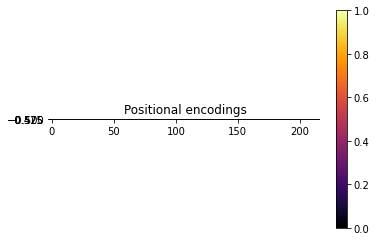

In [ ]:
visualize_abs_positional_embedding()

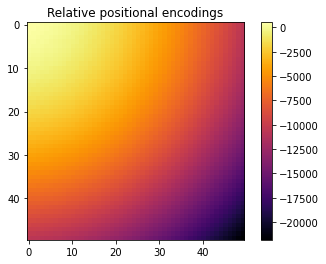

In [ ]:
visualize_rel_positional_embedding((5,5))

In [ ]:
verify_limit()

q=(3,2)
k=(1,3)
delta=(2,-1)
Delta=(2,-1)
If alpha is large, there should be a 1 only at position (1,3)
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]
lim_softmax_A =  1.0


### Question b)

Maximum difference is 0.00023365020751953125, obtained for argument x=1.3737373352050781


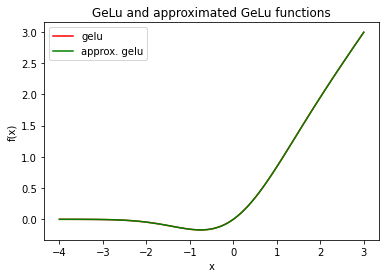

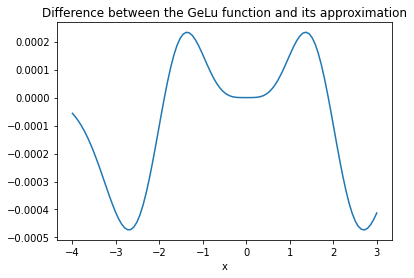

In [ ]:
def gelu(x: torch.Tensor):
    # Implement the GELU activation function for an input tensor x
    # from scipy.stats import norm 

    # return x*torch.tensor(norm.cdf(x))

    return 0.5*x*(1+torch.erf(x/torch.sqrt(torch.tensor(2))))



def approximate_gelu(x: torch.Tensor):
    # Implement an accurate approximation of the GELU activation function for an input tensor x

    return 0.5*x*(1+torch.tanh(torch.sqrt(torch.tensor(2)/torch.pi)*(x+0.044715*x**3)))



if __name__ == "__main__":
    # find the point of maximum difference between gelu and approximate_gelu
    x = torch.linspace(-4,3,100)
    gelu_x = gelu(x)
    approx_gelu_x = approximate_gelu(x)
    diff = gelu_x - approx_gelu_x

    max_diff = torch.max(diff)
    max_idx = torch.argmax(diff)

    print(f'Maximum difference is {max_diff}, obtained for argument x={x[max_idx]}')

    # plot the activation function and its approximation in a single matplotlib figure
    plt.plot(x, gelu_x, color='r', label='gelu')
    plt.plot(x, approx_gelu_x, color='g', label='approx. gelu')

    plt.xlabel("x")
    plt.ylabel("f(x)")
    plt.title("GeLu and approximated GeLu functions")
    plt.legend()
    plt.show()

    # plot the difference between gelu and approximate_gelu in a single matplotlib figure
    plt.plot(x, diff)
    plt.xlabel('x')
    plt.title('Difference between the GeLu function and its approximation')


### Question c)

In [ ]:
# Implement the __init__ and forward() methods of the BertLayerNorm class
# layer_input is a tensor having hidden_size as its last dimension
# the forward method should return a layer-normalized tensor having the same shape as layer_input

class BertLayerNorm(nn.Module):
    def __init__(self, hidden_size: int, eps: float=1e-12):
        super(BertLayerNorm, self).__init__()

        # hidden_size is the number of features, and along that dimensions you should normalize
        self.hidden_size = hidden_size
        self.eps = eps

    def forward(self, layer_input: torch.Tensor):
        mean = layer_input.mean(dim=-1, keepdim=True)
        std = layer_input.std(dim=-1, keepdim=True)

        return (layer_input-mean)/std


### Question d)

In [ ]:
class BertFFN(nn.Module):
    def __init__(self, config):
        super(BertFFN, self).__init__()

        self.dense_1 = nn.Linear(config['hidden_size'], config['intermediate_size'])
        self.act_fn = gelu 

        self.dense_2 = nn.Linear(config['intermediate_size'], config['hidden_size'])
        self.layer_norm = BertLayerNorm(config['hidden_size'], eps=config['layer_norm_eps'])
        self.dropout = nn.Dropout(config['hidden_dropout_prob'])

    def forward(self, input_states: torch.Tensor):
        # Use the layers initialized in the __init__ method to build the forward method
        # of the second half of a BERT Encoder layer.

        input_states = self.act_fn(self.dense_1(input_states))
        input_states = self.dense_2(input_states)
        input_states = self.layer_norm(input_states)

        input_states = self.dropout(input_states)

        return input_states


### Model code (DO NOT CHANGE)

In [ ]:
class GaussianSelfAttention(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.gaussian_init_mu_std = config['gaussian_init_mu_std']
        self.gaussian_init_sigma_std = config['gaussian_init_sigma_std']

        self.num_attention_heads = config['num_attention_heads']
        self.attention_head_size = config['hidden_size']
        self.all_head_size = self.num_attention_heads * config['hidden_size']

        self.attention_centers = nn.Parameter(
            torch.zeros(self.num_attention_heads, 2).normal_(0.0, config['gaussian_init_mu_std'])
        )

        attention_spreads = 1 + torch.zeros(self.num_attention_heads).normal_(0, config['gaussian_init_sigma_std'])

        self.attention_spreads = nn.Parameter(attention_spreads)

        self.value = nn.Linear(self.all_head_size, config['hidden_size'])

        range_ = torch.arange(50)
        grid = torch.cat([t.unsqueeze(-1) for t in torch.meshgrid([range_, range_], indexing='ij')], dim=-1)
        relative_indices = grid.unsqueeze(0).unsqueeze(0) - grid.unsqueeze(-2).unsqueeze(-2)

        R = torch.cat([relative_indices, relative_indices ** 2, (relative_indices[..., 0] * relative_indices[..., 1]).unsqueeze(-1)], dim=-1)
        R = R.float()
        self.register_buffer("R", R)
        self.dropout = nn.Dropout(config['attention_probs_dropout_prob'])

    def get_heads_target_vectors(self):
        a = b = self.attention_spreads ** 2
        mu_1, mu_2 = self.attention_centers[:, 0], self.attention_centers[:, 1]

        t_h = 1/2 * torch.stack([
            2*(a*mu_1),
            2*(b*mu_2),
            -a,
            -b,
            torch.zeros_like(b)
        ], dim=-1)
        return t_h

    def get_attention_probs(self, width, height):
        """Compute the positional attention for an image of size width x height
        Returns: tensor of attention probabilities (width, height, num_head, width, height)
        """
        u = self.get_heads_target_vectors()

        attention_scores = torch.einsum('abcde,fe -> abfcd', [self.R[:width,:height,:width,:height,:], u])
        attention_probs = torch.nn.Softmax(dim=-1)(attention_scores.view(width, height, self.num_attention_heads, -1))
        attention_probs = attention_probs.view(width, height, self.num_attention_heads, width, height)

        return attention_probs

    def forward(self, hidden_states):
        b, w, h, _ = hidden_states.shape

        attention_probs = self.get_attention_probs(w, h)
        attention_probs = self.dropout(attention_probs)

        input_values = torch.einsum('abcde,fdeg->fabcg', attention_probs, hidden_states)
        input_values = input_values.contiguous().view(b, w, h, -1)

        output_value = self.value(input_values)

        return attention_probs, output_value


class BertAttention(nn.Module):
    def __init__(self, config):
        super(BertAttention, self).__init__()
        self.self_attention = GaussianSelfAttention(config)

        self.dense = nn.Linear(config['hidden_size'], config['hidden_size'])
        self.dropout = nn.Dropout(config['hidden_dropout_prob'])
        self.layer_norm = BertLayerNorm(config['hidden_size'], eps=config['layer_norm_eps'])


    def forward(self, input_tensor):
        attentions, self_output = self.self_attention(input_tensor)

        hidden_states = self.dense(self_output)
        hidden_states = self.dropout(hidden_states)
        attention_output = self.layer_norm(hidden_states + input_tensor)

        return attentions, attention_output


class BertLayer(nn.Module):
    def __init__(self, config):
        super(BertLayer, self).__init__()
        self.attention = BertAttention(config)
        self.ffn = BertFFN(config)

    def forward(self, hidden_states):
        attentions, attention_output = self.attention(hidden_states)

        layer_output = self.ffn(attention_output)

        return attentions, layer_output


class BertEncoder(nn.Module):
    def __init__(self, config):
        super(BertEncoder, self).__init__()
        self.layer = nn.ModuleList([BertLayer(config) for _ in range(config['num_hidden_layers'])])

    def forward(self, hidden_states):
        all_attentions = []
        for layer_module in self.layer:
            attentions, hidden_states = layer_module(hidden_states)
            all_attentions.append(attentions)

        last_hidden_states = hidden_states
        return all_attentions, last_hidden_states


class BertModel(nn.Module):
    def __init__(self, config, num_classes):
        super().__init__()

        self.hidden_size = config["hidden_size"]
        self.pooling_concatenate_size = config["pooling_concatenate_size"]

        num_channels_in = 3 * (self.pooling_concatenate_size ** 2)

        self.config = config

        self.features_upscale = nn.Linear(num_channels_in, self.hidden_size)
        self.encoder = BertEncoder(config)
        self.cifar_classifier = nn.Linear(self.hidden_size, num_classes)


    def _invertible_downsampling(self, X, kernel):
        b, h, w, c = X.shape
        Y = X.contiguous().view(b, h, w // kernel, c * kernel)
        Y = Y.permute(0, 2, 1, 3).contiguous()
        Y = Y.view(b, w // kernel, h // kernel, kernel * kernel * c).contiguous()
        Y = Y.permute(0, 2, 1, 3).contiguous()
        return Y


    def forward(self, batch_images):
        batch_features = batch_images.permute(0, 2, 3, 1)
        batch_features = self._invertible_downsampling(batch_features, kernel=self.pooling_concatenate_size)

        batch_features = self.features_upscale(batch_features)

        batch_num = batch_features.shape[0]

        _, last_representation = self.encoder(batch_features)

        cls_representation = last_representation.view(batch_num, -1, self.config['hidden_size']).mean(dim=1)
        cls_prediction = self.cifar_classifier(cls_representation)

        return cls_prediction

### Question e)

In [ ]:
%tensorboard --logdir logs

In [ ]:
# If you have completed questions b to d correctly, this code should run as is without errors
# Don't change the implementation of the main() function, only visualize the positions 
# of the attention heads in the tensorboard session above to answer question e)


#DO NOT CHANGE
def main():
    output_dir = config["output_dir"]
    os.makedirs(output_dir, exist_ok=True)

    writer = SummaryWriter(logdir=output_dir, max_queue=100, flush_secs=10)
    print(f"Tensorboard logs saved in '{output_dir}'")

    torch.manual_seed(config["seed"])
    np.random.seed(config["seed"])

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    training_loader, test_loader = get_dataloaders(test_batch_size=config["batch_size"])
    model = get_model(device)

    if config["load_checkpoint_file"] is not None:
        restore_checkpoint(config["load_checkpoint_file"], model, device)

    max_steps = config["num_epochs"]
    max_steps *= len(training_loader.dataset) // config["batch_size"] + 1

    optimizer = get_optimizer(model.named_parameters())
    scheduler = get_scheduler(
        optimizer, config["optimizer_warmup_ratio"], max_steps
    )
    criterion = torch.nn.CrossEntropyLoss()

    checkpoint_every_n_epoch = None
    if config["num_keep_checkpoints"] > 0:
        checkpoint_every_n_epoch = max(1, config["num_epochs"] // config["num_keep_checkpoints"])
    else:
        checkpoint_every_n_epoch = 999999999999

    global_step = 0

    for epoch in range(config["num_epochs"]):
        print("Epoch {:03d}".format(epoch))

        plot_attention_positions_all_layers(model, 16, writer, epoch)

        model.train()
        writer.add_scalar("train/lr", scheduler.get_last_lr()[0], global_step)

        mean_train_accuracy = Mean()
        mean_train_loss = Mean()

        for batch_x, batch_y in tqdm(training_loader):

            batch_x, batch_y = batch_x.to(device), batch_y.to(device)

            optimizer.zero_grad()

            prediction = model(batch_x)

            classification_loss = criterion(prediction, batch_y)
            loss = classification_loss

            acc = accuracy(prediction, batch_y)
            loss.backward()
            optimizer.step()

            writer.add_scalar("train/loss", loss, global_step)
            writer.add_scalar("train/classification-loss", classification_loss, global_step)
            writer.add_scalar("train/accuracy", acc, global_step)

            global_step += 1

            mean_train_loss.add(loss.item(), weight=len(batch_x))
            mean_train_accuracy.add(acc.item(), weight=len(batch_x))

            scheduler.step()

        log_metric(
            "accuracy", {"epoch": epoch, "value": mean_train_accuracy.value()}, {"split": "train"}
        )
        log_metric(
            "cross_entropy", {"epoch": epoch, "value": mean_train_loss.value()}, {"split": "train"}
        )
        log_metric("lr", {"epoch": epoch, "value": scheduler.get_last_lr()[0]}, {})

        with torch.no_grad():
            model.eval()
            mean_test_accuracy = Mean()
            mean_test_loss = Mean()

            for batch_x, batch_y in test_loader:
                batch_x, batch_y = batch_x.to(device), batch_y.to(device)
                prediction = model(batch_x)
                loss = criterion(prediction, batch_y)
                acc = accuracy(prediction, batch_y)
                mean_test_loss.add(loss.item(), weight=len(batch_x))
                mean_test_accuracy.add(acc.item(), weight=len(batch_x))

        log_metric(
            "accuracy", {"epoch": epoch, "value": mean_test_accuracy.value()}, {"split": "test"}
        )
        log_metric(
            "cross_entropy", {"epoch": epoch, "value": mean_test_loss.value()}, {"split": "test"}
        )
        writer.add_scalar("eval/classification_loss", mean_test_loss.value(), epoch)
        writer.add_scalar("eval/accuracy", mean_test_accuracy.value(), epoch)

        if epoch % checkpoint_every_n_epoch == 0:
            store_checkpoint("{:04d}.checkpoint".format(epoch), model, epoch, mean_test_accuracy.value(), output_dir)

    store_checkpoint(
        "final.checkpoint", model, config["num_epochs"] - 1, mean_test_accuracy.value(), output_dir
    )
    writer.close()


main()

Tensorboard logs saved in './logs/'


  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
Epoch 000


100%|██████████| 500/500 [08:07<00:00,  1.03it/s]

accuracy: {'epoch': 0, 'value': 0.32207999165356155} ({'split': 'train'})
cross_entropy: {'epoch': 0, 'value': 1.8104420559406285} ({'split': 'train'})
lr: {'epoch': 0, 'value': 0.00665335994677312} ({})


accuracy: {'epoch': 0, 'value': 0.42659998863935467} ({'split': 'test'})
cross_entropy: {'epoch': 0, 'value': 1.56361608505249} ({'split': 'test'})
Epoch 001


100%|██████████| 500/500 [08:21<00:00,  1.00s/it]

accuracy: {'epoch': 1, 'value': 0.4767799881100657} ({'split': 'train'})
cross_entropy: {'epoch': 1, 'value': 1.4305942580699913} ({'split': 'train'})
lr: {'epoch': 1, 'value': 0.01330671989354624} ({})


accuracy: {'epoch': 1, 'value': 0.49989998936653146} ({'split': 'test'})
cross_entropy: {'epoch': 1, 'value': 1.4151095604896546} ({'split': 'test'})
Epoch 002


100%|██████████| 500/500 [08:23<00:00,  1.01s/it]

accuracy: {'epoch': 2, 'value': 0.5485199875831613} ({'split': 'train'})
cross_entropy: {'epoch': 2, 'value': 1.2540005767345437} ({'split': 'train'})
lr: {'epoch': 2, 'value': 0.01996007984031936} ({})


accuracy: {'epoch': 2, 'value': 0.5836999872326852} ({'split': 'test'})
cross_entropy: {'epoch': 2, 'value': 1.1540376007556914} ({'split': 'test'})
Epoch 003


100%|██████████| 500/500 [08:22<00:00,  1.00s/it]

accuracy: {'epoch': 3, 'value': 0.5953199865221976} ({'split': 'train'})
cross_entropy: {'epoch': 3, 'value': 1.1272384444475185} ({'split': 'train'})
lr: {'epoch': 3, 'value': 0.02661343978709248} ({})


accuracy: {'epoch': 3, 'value': 0.5538999849557874} ({'split': 'test'})
cross_entropy: {'epoch': 3, 'value': 1.2731208592653278} ({'split': 'test'})
Epoch 004


100%|██████████| 500/500 [08:22<00:00,  1.00s/it]

accuracy: {'epoch': 4, 'value': 0.6246999846100809} ({'split': 'train'})
cross_entropy: {'epoch': 4, 'value': 1.0506205562353137} ({'split': 'train'})
lr: {'epoch': 4, 'value': 0.03326679973386561} ({})


accuracy: {'epoch': 4, 'value': 0.6313999855518345} ({'split': 'test'})
cross_entropy: {'epoch': 4, 'value': 1.1121469283103944} ({'split': 'test'})
Epoch 005


100%|██████████| 500/500 [08:22<00:00,  1.01s/it]

accuracy: {'epoch': 5, 'value': 0.650679985523224} ({'split': 'train'})
cross_entropy: {'epoch': 5, 'value': 0.9885918861627577} ({'split': 'train'})
lr: {'epoch': 5, 'value': 0.03992015968063872} ({})


accuracy: {'epoch': 5, 'value': 0.6552999848127363} ({'split': 'test'})
cross_entropy: {'epoch': 5, 'value': 0.9905157166719438} ({'split': 'test'})
Epoch 006


/usr/local/lib/python3.8/dist-packages/scipy/interpolate/interpolate.py:630: RuntimeWarning: divide by zero encountered in true_divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]
<ipython-input-3-5c37cad0d3b9>:99: UserWarning: No contour levels were found within the data range.
  ax.contour(
100%|██████████| 500/500 [08:21<00:00,  1.00s/it]

accuracy: {'epoch': 6, 'value': 0.6715799834728233} ({'split': 'train'})
cross_entropy: {'epoch': 6, 'value': 0.9406987732648844} ({'split': 'train'})
lr: {'epoch': 6, 'value': 0.046573519627411845} ({})


accuracy: {'epoch': 6, 'value': 0.6476999849081041} ({'split': 'test'})
cross_entropy: {'epoch': 6, 'value': 1.0777852910757062} ({'split': 'test'})
Epoch 007


100%|██████████| 500/500 [08:21<00:00,  1.00s/it]

accuracy: {'epoch': 7, 'value': 0.6814199832677839} ({'split': 'train'})
cross_entropy: {'epoch': 7, 'value': 0.9134646689891814} ({'split': 'train'})
lr: {'epoch': 7, 'value': 0.05322687957418496} ({})


accuracy: {'epoch': 7, 'value': 0.687099983692169} ({'split': 'test'})
cross_entropy: {'epoch': 7, 'value': 0.918211702108383} ({'split': 'test'})
Epoch 008


100%|██████████| 500/500 [08:20<00:00,  1.00s/it]

accuracy: {'epoch': 8, 'value': 0.685299983859062} ({'split': 'train'})
cross_entropy: {'epoch': 8, 'value': 0.9045731865167609} ({'split': 'train'})
lr: {'epoch': 8, 'value': 0.059880239520958084} ({})


accuracy: {'epoch': 8, 'value': 0.6584999859333039} ({'split': 'test'})
cross_entropy: {'epoch': 8, 'value': 1.0189991855621339} ({'split': 'test'})
Epoch 009


100%|██████████| 500/500 [08:21<00:00,  1.00s/it]

accuracy: {'epoch': 9, 'value': 0.67913998401165} ({'split': 'train'})
cross_entropy: {'epoch': 9, 'value': 0.9180729713439947} ({'split': 'train'})
lr: {'epoch': 9, 'value': 0.06653359946773121} ({})


accuracy: {'epoch': 9, 'value': 0.6921999812126161} ({'split': 'test'})
cross_entropy: {'epoch': 9, 'value': 0.9084558016061783} ({'split': 'test'})
Epoch 010


100%|██████████| 500/500 [08:21<00:00,  1.00s/it]

accuracy: {'epoch': 10, 'value': 0.6738999835848808} ({'split': 'train'})
cross_entropy: {'epoch': 10, 'value': 0.9427457941770552} ({'split': 'train'})
lr: {'epoch': 10, 'value': 0.07318695941450433} ({})


accuracy: {'epoch': 10, 'value': 0.6847999799251555} ({'split': 'test'})
cross_entropy: {'epoch': 10, 'value': 0.9364489769935609} ({'split': 'test'})
Epoch 011


100%|██████████| 500/500 [08:20<00:00,  1.00s/it]

accuracy: {'epoch': 11, 'value': 0.6703199844956398} ({'split': 'train'})
cross_entropy: {'epoch': 11, 'value': 0.9491714308261873} ({'split': 'train'})
lr: {'epoch': 11, 'value': 0.07984031936127745} ({})


accuracy: {'epoch': 11, 'value': 0.6895999842882155} ({'split': 'test'})
cross_entropy: {'epoch': 11, 'value': 0.9052254962921144} ({'split': 'test'})
Epoch 012


100%|██████████| 500/500 [08:21<00:00,  1.00s/it]

accuracy: {'epoch': 12, 'value': 0.669799985349178} ({'split': 'train'})
cross_entropy: {'epoch': 12, 'value': 0.9503128671646112} ({'split': 'train'})
lr: {'epoch': 12, 'value': 0.08649367930805058} ({})


accuracy: {'epoch': 12, 'value': 0.6875999861955642} ({'split': 'test'})
cross_entropy: {'epoch': 12, 'value': 0.9221955722570417} ({'split': 'test'})
Epoch 013


100%|██████████| 500/500 [08:21<00:00,  1.00s/it]

accuracy: {'epoch': 13, 'value': 0.6633199839591984} ({'split': 'train'})
cross_entropy: {'epoch': 13, 'value': 0.9776310738325115} ({'split': 'train'})
lr: {'epoch': 13, 'value': 0.09314703925482369} ({})


accuracy: {'epoch': 13, 'value': 0.6954999840259554} ({'split': 'test'})
cross_entropy: {'epoch': 13, 'value': 0.9023858767747879} ({'split': 'test'})
Epoch 014


100%|██████████| 500/500 [08:20<00:00,  1.00s/it]

accuracy: {'epoch': 14, 'value': 0.6596199856400489} ({'split': 'train'})
cross_entropy: {'epoch': 14, 'value': 0.9892803519964221} ({'split': 'train'})
lr: {'epoch': 14, 'value': 0.0998003992015968} ({})


accuracy: {'epoch': 14, 'value': 0.6604999870061877} ({'split': 'test'})
cross_entropy: {'epoch': 14, 'value': 0.9698233795166012} ({'split': 'test'})
Epoch 015


100%|██████████| 500/500 [08:20<00:00,  1.00s/it]

accuracy: {'epoch': 15, 'value': 0.6609199850559228} ({'split': 'train'})
cross_entropy: {'epoch': 15, 'value': 0.9802687036991116} ({'split': 'train'})
lr: {'epoch': 15, 'value': 0.0999971532197883} ({})


accuracy: {'epoch': 15, 'value': 0.6874999833106995} ({'split': 'test'})
cross_entropy: {'epoch': 15, 'value': 0.9320580369234083} ({'split': 'test'})
Epoch 016


100%|██████████| 500/500 [08:21<00:00,  1.00s/it]

accuracy: {'epoch': 16, 'value': 0.6710399845838543} ({'split': 'train'})
cross_entropy: {'epoch': 16, 'value': 0.9480036778450011} ({'split': 'train'})
lr: {'epoch': 16, 'value': 0.0999882583252848} ({})


accuracy: {'epoch': 16, 'value': 0.7121999830007553} ({'split': 'test'})
cross_entropy: {'epoch': 16, 'value': 0.8725589150190353} ({'split': 'test'})
Epoch 017


100%|██████████| 500/500 [08:24<00:00,  1.01s/it]

accuracy: {'epoch': 17, 'value': 0.6915599844455714} ({'split': 'train'})
cross_entropy: {'epoch': 17, 'value': 0.8919556580781933} ({'split': 'train'})
lr: {'epoch': 17, 'value': 0.09997331366992267} ({})


accuracy: {'epoch': 17, 'value': 0.6950999838113784} ({'split': 'test'})
cross_entropy: {'epoch': 17, 'value': 0.9443146044015882} ({'split': 'test'})
Epoch 018


100%|██████████| 500/500 [08:22<00:00,  1.00s/it]

accuracy: {'epoch': 18, 'value': 0.6997399848699573} ({'split': 'train'})
cross_entropy: {'epoch': 18, 'value': 0.8679398968219758} ({'split': 'train'})
lr: {'epoch': 18, 'value': 0.09995232106235848} ({})


accuracy: {'epoch': 18, 'value': 0.724799982905388} ({'split': 'test'})
cross_entropy: {'epoch': 18, 'value': 0.8085745185613633} ({'split': 'test'})
Epoch 019


100%|██████████| 500/500 [08:21<00:00,  1.00s/it]

accuracy: {'epoch': 19, 'value': 0.7041999824047089} ({'split': 'train'})
cross_entropy: {'epoch': 19, 'value': 0.8615468724966048} ({'split': 'train'})
lr: {'epoch': 19, 'value': 0.09992528304319395} ({})


accuracy: {'epoch': 19, 'value': 0.712199985384941} ({'split': 'test'})
cross_entropy: {'epoch': 19, 'value': 0.8595878696441653} ({'split': 'test'})
Epoch 020


100%|██████████| 500/500 [08:20<00:00,  1.00s/it]

accuracy: {'epoch': 20, 'value': 0.7089999841451642} ({'split': 'train'})
cross_entropy: {'epoch': 20, 'value': 0.8425338889360431} ({'split': 'train'})
lr: {'epoch': 20, 'value': 0.09989220288466855} ({})


accuracy: {'epoch': 20, 'value': 0.7336999815702441} ({'split': 'test'})
cross_entropy: {'epoch': 20, 'value': 0.7803226029872893} ({'split': 'test'})
Epoch 021


  7%|▋         | 35/500 [00:35<07:57,  1.03s/it]


KeyboardInterrupt: ignored